In [19]:
## /share/local/singularity/bin/singularity exec /home/j/temp/stan/docker_gcc/latest.img python
## /share/local/singularity/bin/singularity exec /home/j/temp/stan/docker_gcc/latest.img /bin/bash -c 'jupyter-notebook --ip='*' --port=8888 --no-browser'
## Stan Biryukov
## stan0625@uw.edu
## 2/5/18
## Demonstrate survival analysis on ARIC data with xgboost
## Goal is to extract relative risks.
## Research questions:
    ## 1) Do models using food items perform better than models using food groups in predicting CHD events?
    ## 2) Which component of diet are more important in predicting CHD?
    ## 3) What is the effect size of each component of diet on CHD? 
import glob
import os
import sys
import subprocess
import numpy as np 
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
import xgboost as xgb
import shap
from multiprocessing.dummy import Pool as ThreadPool
import urllib.request
from matplotlib import pyplot
from sklearn.metrics import accuracy_score
from sklearn.cross_validation import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GroupShuffleSplit
import IPython
import shap
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
# load JS visualization code to notebook
shap.initjs() 

print(IPython.sys_info())
CORES = int(subprocess.check_output("grep '^core id' /proc/cpuinfo |sort -u|wc -l",shell=True).decode('utf-8').strip())

SEED = 7162
np.random.seed(SEED)

dt = pd.read_csv("/home/j/WORK/05_risk/pooled_cohorts/pooled_cohorts_tmpfiles/step3/07_data_with_endpoints/ARIC_full_data.csv",index_col=0)
dt.rename(columns={'person_id': 'ID_C'}, inplace=True)
dt.rename(columns={'age_year': 'age'}, inplace=True)
dt.rename(columns={'bmi_cont': 'bmi'}, inplace=True)
dt.rename(columns={'exam': 'exam_number'}, inplace=True)

dt = dt[['ID_C','exam_number','age','sex_id','days_since_baseline','bmi','cig_amt_average','alc_gday_cont','race_cat']]

## join some other covariates I extracted
aha = pd.read_csv('/home/j/temp/stan/cohorts/data/compiled_TF.csv')
aha = aha[aha.cohort == 'aric']
aha = aha[aha.exam==1]
## aha = aha[['pid', 'mean_sbp', 'history', 'hypt_meds', 'plasma_chol', 'mean_hdl', 'mean_ldl', 'mean_tri', 'fpg', 'c_protein','diab_meds']]
aha = aha[['pid', 'hypt_meds','diab_meds']]
aha.rename(columns={'pid': 'ID_C'}, inplace=True)

end = pd.read_csv('/home/j/WORK/05_risk/pooled_cohorts/pooled_cohorts_tmpfiles/step3/07_data_with_endpoints/ARIC_CHD_mortality.csv')
end.head()
end['event'] = np.where(end['chd_death_definite']==1, 1, 0)
end = end[['ID_C','event','fudays_last_observed','chd_history']]
dt = pd.merge(dt,end,how='left',on='ID_C')
dt = pd.merge(dt,aha,how='left',on='ID_C')
## remove those with chd history
dt = dt.loc[dt['chd_history'] != 1]
dt = dt.drop(['chd_history'],axis=1)

## convert to two months of observation
dt['days_since_baseline'] = dt['days_since_baseline']/60
dt['fudays_last_observed'] = dt['fudays_last_observed']/60
dt['time'] = dt['fudays_last_observed'] - dt['days_since_baseline']

{'commit_hash': 'd86648c5d',
 'commit_source': 'installation',
 'default_encoding': 'UTF-8',
 'ipython_path': '/opt/conda/lib/python3.6/site-packages/IPython',
 'ipython_version': '6.1.0',
 'os_name': 'posix',
 'platform': 'Linux-2.6.32-696.3.1.el6.centos.plus.x86_64-x86_64-with-debian-9.3',
 'sys_executable': '/opt/conda/bin/python',
 'sys_platform': 'linux',
 'sys_version': '3.6.3 |Intel Corporation| (default, Oct 16 2017, 15:28:36) \n'
                '[GCC 4.8.2 20140120 (Red Hat 4.8.2-15)]'}


/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [20]:
## merge on diet
diet = pd.read_csv('/home/j/temp/pj/pooled_cohort/data/aric/prepped/for_stan/aric_cleaned_12_13_17.csv')
diet['year']=1
diet.head()

diet_2 = pd.read_csv('/home/j/temp/pj/pooled_cohort/data/aric/raw/dti2.csv',index_col=0)
diet_2.head()
diet_2['year']=4

diet = diet.append(diet_2)
diet.head()

conv = pd.read_csv('/home/j/temp/pj/pooled_cohort/food_conversion_units_pj_12_4_17.csv')
conv = conv[['food_item','food_group','aric_name','aric_serving']]
conv.rename(columns={'aric_name': 'variable'}, inplace=True)
conv.drop_duplicates()
conv.head()
conv = conv.groupby('variable',as_index=False).first()
diet.rename(columns={'year': 'exam_number'}, inplace=True)

diet = pd.merge(conv,diet,how='left')
diet.head()

fg = pd.pivot_table(diet,index=['pid','exam_number'], columns=['food_group'], values='value')
fi = pd.pivot_table(diet,index=['pid','exam_number'], columns=['food_item'], values='value')
## food groups or food items?
fi_cols = list(fi)
fg_cols = list(fg)

dw = pd.concat([fg,fi],axis=1)
dw.reset_index(level=0, inplace=True)
dw.reset_index(level=0, inplace=True)
dw.rename(columns={'pid': 'ID_C'}, inplace=True)
dt = pd.merge(dt,dw,how='left',on=['ID_C','exam_number'])

In [21]:
## carryforward observations
fill = dt.groupby(['ID_C'],as_index=False).apply(lambda group: group.bfill().ffill())
dt = fill

In [22]:
# list columns that contain any nas
cols = dt.columns[dt.isnull().any()].tolist()
cols.remove('fudays_last_observed')
cols.remove('time')
cols.remove('event')
cols.remove('cig_amt_average')
## nan means non smoker so fill average with 0, not median
dt['cig_amt_average'] = np.where(dt[['cig_amt_average']].isnull(),0,dt[['cig_amt_average']])

In [23]:
## add dummies for missing and impute with median
for i in cols:
    try:
        ## replace na with median
        dt[i].fillna((dt[i].median()), inplace=True)
        n = i + '_miss'
        dt[n] = np.where(dt[[i]].isnull(), 1, 0)
    except:
        pass

In [24]:
## convert to discrete survival -> expand on time
## see 7.6.2: http://data.princeton.edu/wws509/notes/c7.pdf
## with CHD
w = dt.loc[dt['time'] > 0]
w['diff'] = w.groupby(['ID_C'])['time'].diff(-1)
w['diff'] = np.where(np.isnan(w['diff']),w['fudays_last_observed']-w['days_since_baseline'],w['diff'])
w['diff'] = w['diff'].astype('int')
w = w.reindex(np.repeat(w.index, w['diff'])).reset_index(drop=True) ## expand on time
w['period'] = w.groupby(['ID_C']).cumcount()+1
w['N'] = w.groupby('ID_C')['ID_C'].transform('count')
w['y'] = np.where((w['period'] == w['N']),1,0)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-d

In [25]:
ll = w.groupby(['ID_C','days_since_baseline','exam_number']).size()

In [26]:
## without CHD
wo = dt.loc[np.isnan(dt['time'])]
wo['diff'] = wo.groupby(['ID_C'])['days_since_baseline'].diff(-1)
wo['diff'] = np.abs(wo['diff'])
wo['diff'] = np.where(np.isnan(wo['diff']),wo['fudays_last_observed']-wo['days_since_baseline'],wo['diff'])
wo['diff'] = np.where(np.isnan(wo['diff']),dt['days_since_baseline'].max(),wo['diff'])
wo['y'] = 0
wo['diff'] = wo['diff'].astype('int')
wo = wo.reindex(np.repeat(wo.index, wo['diff'])).reset_index(drop=True) ## expand on time
wo['period'] = wo.groupby(['ID_C']).cumcount()+1
dt = w.append(wo, ignore_index = True)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

In [27]:
dt.y.value_counts()

0    1452368
1       6882
Name: y, dtype: int64

In [28]:
dt.drop(['time','days_since_baseline','fudays_last_observed','N','diff','exam_number','event'],axis=1,inplace=True)
## order ID and y
cols = list(dt)
cols.insert(0, cols.pop(cols.index('ID_C')))
dt = dt.loc[:, cols]
cols.insert(0, cols.pop(cols.index('y')))
dt = dt.loc[:, cols]

In [29]:
## for glm comparison
dt_glm = dt

## encode time as categorical
one_hot = pd.get_dummies(dt['period'],prefix='month')
dt = dt.drop('period',axis=1)
dt = dt.join(one_hot)
dt_ = dt

In [30]:
## food groups model
dt = dt_
for i in fi_cols:
    ii = i + '_miss'
    dt = dt.drop(i, axis = 1)
    dt = dt.drop(ii, axis = 1)

## numeric
dt = dt.select_dtypes(include=[np.number])
list(dt)

['y',
 'age',
 'alc_bev_g',
 'alc_bev_g_miss',
 'alc_gday_cont',
 'alc_gday_cont_miss',
 'bmi',
 'bmi_miss',
 'cheese_g',
 'cheese_g_miss',
 'cig_amt_average',
 'coffee_g',
 'coffee_g_miss',
 'dairy_oth_g',
 'dairy_oth_g_miss',
 'diab_meds',
 'diab_meds_miss',
 'diet_bev_g',
 'diet_bev_g_miss',
 'eggs_g',
 'eggs_g_miss',
 'fish_shellfish_g',
 'fish_shellfish_g_miss',
 'fruit_juice_g',
 'fruit_juice_g_miss',
 'fruits_g',
 'fruits_g_miss',
 'hypt_meds',
 'hypt_meds_miss',
 'legumes_g',
 'legumes_g_miss',
 'lipids_g',
 'lipids_g_miss',
 'milk_g',
 'milk_g_miss',
 'mixed_dishes_g',
 'mixed_dishes_g_miss',
 'nuts_and_seeds_g',
 'nuts_and_seeds_g_miss',
 'poultry_g',
 'poultry_g_miss',
 'proc_meat_g',
 'proc_meat_g_miss',
 'red_meat_g',
 'red_meat_g_miss',
 'refined_grain_g',
 'refined_grain_g_miss',
 'sex_id',
 'starchy_vegetables_g',
 'starchy_vegetables_g_miss',
 'sugar_products_g',
 'sugar_products_g_miss',
 'sugar_swt_bev_g',
 'sugar_swt_bev_g_miss',
 'tea_g',
 'tea_g_miss',
 'vegetables_g',
 'vegetables_g_miss',
 'whole_grain_g',
 'whole_grain_g_miss',
 'yogurt_g',
 'yogurt_g_miss',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12',
 'month_13',
 'month_14',
 'month_15',
 'month_16',
 'month_17',
 'month_18',
 'month_19',
 'month_20',
 'month_21',
 'month_22',
 'month_23',
 'month_24',
 'month_25',
 'month_26',
 'month_27',
 'month_28',
 'month_29',
 'month_30',
 'month_31',
 'month_32',
 'month_33',
 'month_34',
 'month_35',
 'month_36',
 'month_37',
 'month_38',
 'month_39',
 'month_40',
 'month_41',
 'month_42',
 'month_43',
 'month_44',
 'month_45',
 'month_46',
 'month_47',
 'month_48',
 'month_49',
 'month_50',
 'month_51',
 'month_52',
 'month_53',
 'month_54',
 'month_55',
 'month_56',
 'month_57',
 'month_58',
 'month_59',
 'month_60',
 'month_61',
 'month_62',
 'month_63',
 'month_64',
 'month_65',
 'month_66',
 'month_67',
 'month_68',
 'month_69',
 'month_70',
 'month_71',
 'month_72',
 'month_73',
 'month_74',
 'month_75',
 'month_76',
 'month_77',
 'month_78',
 'month_79',
 'month_80',
 'month_81',
 'month_82',
 'month_83',
 'month_84',
 'month_85',
 'month_86',
 'month_87',
 'month_88',
 'month_89',
 'month_90',
 'month_91',
 'month_92',
 'month_93',
 'month_94',
 'month_95',
 'month_96',
 'month_97',
 'month_98',
 'month_99',
 'month_100',
 'month_101',
 'month_102',
 'month_103',
 'month_104',
 'month_105',
 'month_106',
 'month_107',
 'month_108',
 'month_109',
 'month_110',
 'month_111',
 'month_112',
 'month_113',
 'month_114',
 'month_115',
 'month_116',
 'month_117',
 'month_118',
 'month_119',
 'month_120',
 'month_121',
 'month_122',
 'month_123',
 'month_124',
 'month_125',
 'month_126',
 'month_127',
 'month_128',
 'month_129',
 'month_130',
 'month_131',
 'month_132',
 'month_133',
 'month_134',
 'month_135',
 'month_136',
 'month_137',
 'month_138',
 'month_139',
 'month_140',
 'month_141',
 'month_142',
 'month_143',
 'month_144']

In [31]:
X = dt[dt.columns[1:]]
Y = dt[dt.columns[0:1]]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.2, random_state=SEED, stratify=Y)

In [32]:
## with a Poisson log-link model, we can interpret the probability ratios as relative risks. 
## set xgboost parameters and assign class weights
ww = np.divide(len(Y_train)-np.sum(Y_train),np.sum(Y_train))
ww = ww.y.astype(float)

params = {
    "n_jobs": CORES,
    "nthread": CORES,
    "objective": "count:poisson",
    "eval_metric": "poisson-nloglik",
    "silent": 1,
    "scale_pos_weight": ww,
}

from sklearn.utils import class_weight
weight_train = pd.DataFrame({'weight':class_weight.compute_class_weight('balanced', np.unique(Y_train), Y_train.as_matrix().ravel())})
weight_train['y'] = weight_train.index
yy = pd.merge(Y_train,weight_train)
weight_train = yy[['weight']]
## set up training matrix for xgboost
dtrain = xgb.DMatrix(X_train,label=Y_train,weight=weight_train)

weight_test = pd.DataFrame({'weight':class_weight.compute_class_weight('balanced', np.unique(Y_test), Y_test.as_matrix().ravel())})
weight_test['y'] = weight_test.index
yy = pd.merge(Y_test,weight_test)
weight_test = yy[['weight']]
dvalid = xgb.DMatrix(X_test,label=Y_test,weight=weight_test)

## run model
progress = dict()
bst = xgb.train(params, dtrain, 2000, [(dtrain, "train"),(dvalid, "valid")], evals_result=progress, verbose_eval=50, early_stopping_rounds = 250, maximize=False)

[0]	train-poisson-nloglik:0.435364	valid-poisson-nloglik:0.435188
Multiple eval metrics have been passed: 'valid-poisson-nloglik' will be used for early stopping.

Will train until valid-poisson-nloglik hasn't improved in 250 rounds.
[50]	train-poisson-nloglik:0.018672	valid-poisson-nloglik:0.028291
[100]	train-poisson-nloglik:0.016811	valid-poisson-nloglik:0.026526
[150]	train-poisson-nloglik:0.015933	valid-poisson-nloglik:0.026158
[200]	train-poisson-nloglik:0.015368	valid-poisson-nloglik:0.026066
[250]	train-poisson-nloglik:0.014876	valid-poisson-nloglik:0.0259
[300]	train-poisson-nloglik:0.014434	valid-poisson-nloglik:0.025799
[350]	train-poisson-nloglik:0.014028	valid-poisson-nloglik:0.02575
[400]	train-poisson-nloglik:0.013683	valid-poisson-nloglik:0.0259
[450]	train-poisson-nloglik:0.013317	valid-poisson-nloglik:0.025899
[500]	train-poisson-nloglik:0.01299	valid-poisson-nloglik:0.025923
[550]	train-poisson-nloglik:0.01268	valid-poisson-nloglik:0.025872
[600]	train-poisson-nlogli

In [33]:
## compute deviance (-2*log-likelihood)
import scipy as sp 
mu = bst.predict(dvalid).reshape(-1,1)
print('xgboost test deviance',-2 * np.sum(np.log(sp.stats.poisson.pmf(Y_test, mu))))

xgboost test deviance 15764.558088575473


In [34]:
## Kfold crossval deviance
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score

def xg_cv(n_splits=10):
    kf = KFold(n_splits=n_splits)
    dev = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]   
        ## sample
        dvalid = xgb.DMatrix(X_test,label=Y_test)
        mu = bst.predict(dvalid).reshape(-1,1)
        devv = -2 * np.sum(np.log(sp.stats.poisson.pmf(Y_test, mu)))
        dev.append(devv)
    return {'deviance':dev}

In [35]:
cv = xg_cv(10)
print("xgboost oos deviance: ", np.mean(cv['deviance']))

xgboost oos deviance:  5884.002001189223


In [36]:
## compare to glm
## food groups glm model
# dt = dt_.drop(fi_cols,axis=1)
dd = dt_glm

for i in fi_cols:
    ii = i + '_miss'
    dd = dd.drop(i, axis = 1)
    dd = dd.drop(ii, axis = 1)

## numeric
dd = dd.select_dtypes(include=[np.number])
dd = dd.dropna()
X = dd[dd.columns[1:]]
Y = dd[dd.columns[0:1]]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.2, random_state=SEED, stratify=Y)

In [39]:
## poisson reg
## for run time, treat time as continuous.
import statsmodels.api as sm
p1 = sm.GLM(Y_train, X_train, family = sm.families.Poisson())
m1 = p1.fit()
mup = m1.predict(X_test).reshape(-1,1)
print('poisson regression test deviance',-2 * np.sum(np.log(sp.stats.poisson.pmf(Y_test, mup))))

poisson regression test deviance 15990.780806986602


/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  import sys


In [40]:
## Kfold crossval deviance for stats models
def sm_cv(n_splits=10):
    kf = KFold(n_splits=n_splits)
    dev = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]   
        mup = m1.predict(X_test).reshape(-1,1)
        devv = -2 * np.sum(np.log(sp.stats.poisson.pmf(Y_test, mup)))
        dev.append(devv)
    return {'pois deviance': dev}

In [41]:
cvp = sm_cv(10)
print("poisson oos deviance: ", np.mean(cvp['pois deviance']))
# 5884.002001189223<<8002.435465879998 ## xgboost model has a lower deviance

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  


poisson oos deviance:  8002.435465879998


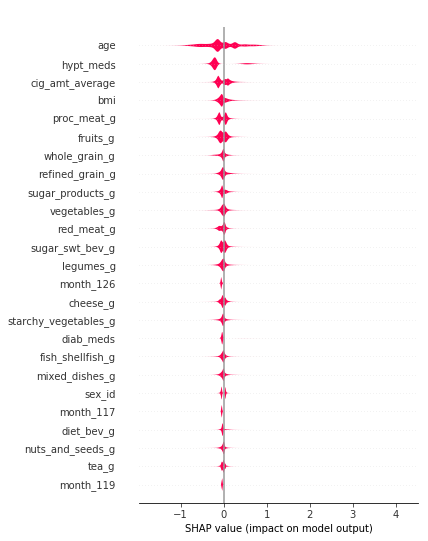

In [42]:
## Shapley plots on test data
## falls out as log risk since the Poisson objective utilizes a log-link in xgboost
X = dt[dt.columns[1:]]
Y = dt[dt.columns[0:1]]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.2, random_state=SEED, stratify=Y)

shap_values = bst.predict(xgb.DMatrix(X_test), pred_contribs=True)
s_plot = shap.summary_plot(shap_values, X_test.columns, max_display=25)

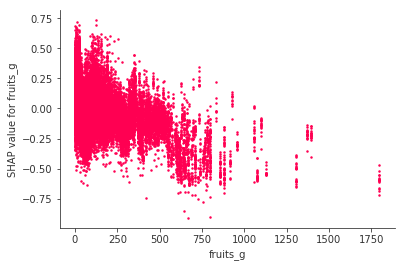

In [43]:
## dose response on test data
## divide by theoretical minimum exposure risk category for relative risks.
ll = X_test.columns.get_loc("fruits_g")
shap.plot((X_test.iloc[:,ll].as_matrix()), shap_values[:,ll], "fruits_g")

In [44]:
## food item model
dt = dt_
for i in fg_cols:
    ii = i + '_miss'
    dt = dt.drop(i, axis = 1)
    dt = dt.drop(ii, axis = 1)

## numeric
dt = dt.select_dtypes(include=[np.number])
list(dt)

['y',
 'American cheese',
 'American cheese_miss',
 'Cheerios',
 'Cheerios_miss',
 'Hi-C, Kool-Aid, or Tang',
 'Hi-C, Kool-Aid, or Tang_miss',
 'age',
 'alc_gday_cont',
 'alc_gday_cont_miss',
 'apples',
 'apples_miss',
 'apricots',
 'apricots_miss',
 'bacon',
 'bacon_miss',
 'baked beans',
 'baked beans_miss',
 'bananas',
 'bananas_miss',
 'beef chuck',
 'beef chuck_miss',
 'beer',
 'beer_miss',
 'biscuits, commercially prepared',
 'biscuits, commercially prepared_miss',
 'blackberries, canned',
 'blackberries, canned_miss',
 'bluefish',
 'bluefish_miss',
 'bmi',
 'bmi_miss',
 'bologna',
 'bologna_miss',
 'bread, cracked wheat',
 'bread, cracked wheat_miss',
 'bread, french or vienna',
 'bread, french or vienna_miss',
 'broccoli',
 'broccoli_miss',
 'brownies, commercially prepared',
 'brownies, commercially prepared_miss',
 'brussels sprouts',
 'brussels sprouts_miss',
 'butter',
 'butter_miss',
 'carbonated beverage other than cola, caffeine free',
 'carbonated beverage other than cola, caffeine free_miss',
 'carrots, cooked',
 'carrots, cooked_miss',
 'catfish (white fish)',
 'catfish (white fish)_miss',
 'chicken no skin',
 'chicken no skin_miss',
 'chicken with skin',
 'chicken with skin_miss',
 'cig_amt_average',
 'coffee, prepared',
 'coffee, prepared_miss',
 'coffeecake, commercially prepared',
 'coffeecake, commercially prepared_miss',
 'collards, cooked',
 'collards, cooked_miss',
 'condiments, general (ketchup, soy sauce, steak sauce)',
 'condiments, general (ketchup, soy sauce, steak sauce)_miss',
 'cookies, chocolate chip, commercially prepared',
 'cookies, chocolate chip, commercially prepared_miss',
 'corn on the cob',
 'corn on the cob_miss',
 'cottage cheese, low fat',
 'cottage cheese, low fat_miss',
 'cracked wheat, bulgur',
 'cracked wheat, bulgur_miss',
 'diab_meds',
 'diab_meds_miss',
 'diet carbonated beverage other than cola, caffeine free',
 'diet carbonated beverage other than cola, caffeine free_miss',
 'doughnuts, cake-type',
 'doughnuts, cake-type_miss',
 'eggs',
 'eggs_miss',
 'french fried potatoes, home prepared',
 'french fried potatoes, home prepared_miss',
 'fried food, all kinds, fried at home (fried chicken, fish, oysters, shrimp, plantain)',
 'fried food, all kinds, fried at home (fried chicken, fish, oysters, shrimp, plantain)_miss',
 'fried food, various, fried away from home (fried chicken, fish, oysters, shrimp, plantain, chicken nuggets, refried beans, french fries)',
 'fried food, various, fried away from home (fried chicken, fish, oysters, shrimp, plantain, chicken nuggets, refried beans, french fries)_miss',
 'grapefruit juice',
 'grapefruit juice_miss',
 'green beans, string beans',
 'green beans, string beans_miss',
 'ground beef/hamburger',
 'ground beef/hamburger_miss',
 'hot dog, beef',
 'hot dog, beef_miss',
 'hypt_meds',
 'hypt_meds_miss',
 'ice cream, chocolate',
 'ice cream, chocolate_miss',
 'lasagna, meat and cheese (spaghetti)',
 'lasagna, meat and cheese (spaghetti)_miss',
 'lima beans',
 'lima beans_miss',
 'liquor',
 'liquor_miss',
 'lobster, northern',
 'lobster, northern_miss',
 'low fat milk',
 'low fat milk_miss',
 'milk chocolate',
 'milk chocolate_miss',
 'noodles, macaroni',
 'noodles, macaroni_miss',
 'oranges',
 'oranges_miss',
 'peanut bar',
 'peanut bar_miss',
 'peanut butter, smooth',
 'peanut butter, smooth_miss',
 'peanuts',
 'peanuts_miss',
 'pie, apple, commercially prepared',
 'pie, apple, commercially prepared_miss',
 'pie, apple, homemade',
 'pie, apple, homemade_miss',
 'potato chips or corn chips',
 'potato chips or corn chips_miss',
 'potatoes with skin',
 'potatoes with skin_miss',
 'rice, white',
 'rice, white_miss',
 'salt',
 'salt_miss',
 'sex_id',
 'skim yogurt',
 'skim yogurt_miss',
 'stick margarine',
 'stick margarine_miss',
 'sweet potato, mashed',
 'sweet potato, mashed_miss',
 'tea, black, prepared',
 'tea, black, prepared_miss',
 'tomato',
 'tomato_miss',
 'tuna, canned in oil',
 'tuna, canned in oil_miss',
 'whole milk',
 'whole mil

In [45]:
X = dt[dt.columns[1:]]
Y = dt[dt.columns[0:1]]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.2, random_state=SEED, stratify=Y)

In [46]:
## set xgboost parameters and assign class weights
ww = np.divide(len(Y_train)-np.sum(Y_train),np.sum(Y_train))
ww = ww.y.astype(float)

params = {
    "n_jobs": CORES,
    "nthread": CORES,
    "objective": "count:poisson",
    "eval_metric": "poisson-nloglik",
    "silent": 1,
    "scale_pos_weight": ww,
}

from sklearn.utils import class_weight
weight_train = pd.DataFrame({'weight':class_weight.compute_class_weight('balanced', np.unique(Y_train), Y_train.as_matrix().ravel())})
weight_train['y'] = weight_train.index
yy = pd.merge(Y_train,weight_train)
weight_train = yy[['weight']]
## set up training matrix for xgboost
dtrain = xgb.DMatrix(X_train,label=Y_train,weight=weight_train)

weight_test = pd.DataFrame({'weight':class_weight.compute_class_weight('balanced', np.unique(Y_test), Y_test.as_matrix().ravel())})
weight_test['y'] = weight_test.index
yy = pd.merge(Y_test,weight_test)
weight_test = yy[['weight']]
dvalid = xgb.DMatrix(X_test,label=Y_test,weight=weight_test)

## run model
progress = dict()
bst = xgb.train(params, dtrain, 2000, [(dtrain, "train"),(dvalid, "valid")], evals_result=progress, verbose_eval=50, early_stopping_rounds = 250, maximize=False)


[0]	train-poisson-nloglik:0.435358	valid-poisson-nloglik:0.435155
Multiple eval metrics have been passed: 'valid-poisson-nloglik' will be used for early stopping.

Will train until valid-poisson-nloglik hasn't improved in 250 rounds.
[50]	train-poisson-nloglik:0.018624	valid-poisson-nloglik:0.027926
[100]	train-poisson-nloglik:0.016805	valid-poisson-nloglik:0.026574
[150]	train-poisson-nloglik:0.015925	valid-poisson-nloglik:0.02611
[200]	train-poisson-nloglik:0.015333	valid-poisson-nloglik:0.025834
[250]	train-poisson-nloglik:0.014855	valid-poisson-nloglik:0.025847
[300]	train-poisson-nloglik:0.014421	valid-poisson-nloglik:0.025864
[350]	train-poisson-nloglik:0.014043	valid-poisson-nloglik:0.02573
[400]	train-poisson-nloglik:0.01368	valid-poisson-nloglik:0.025798
[450]	train-poisson-nloglik:0.013352	valid-poisson-nloglik:0.025675
[500]	train-poisson-nloglik:0.013012	valid-poisson-nloglik:0.025899
[550]	train-poisson-nloglik:0.012708	valid-poisson-nloglik:0.025801
[600]	train-poisson-nl

In [47]:
cv = xg_cv(10)
print("xgboost oos deviance: ", np.mean(cv['deviance']))
## food group deviance: 5884.002001189223
## food item deviance: 5687.549830276282
## including food items instead of food groups results in a better performing survival model

xgboost oos deviance:  5687.549830276282


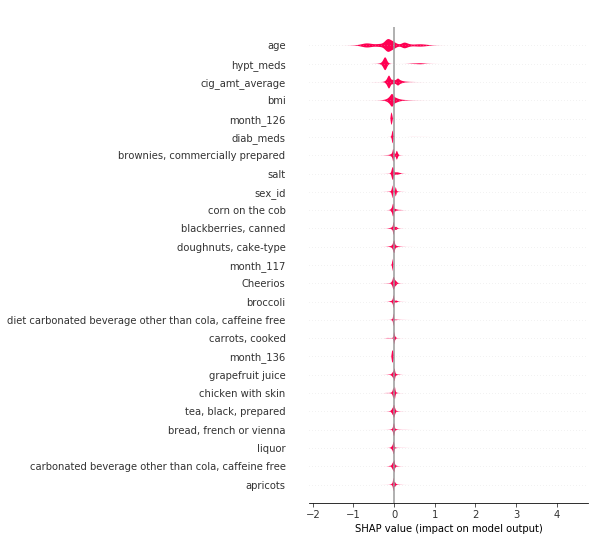

In [48]:
shap_values = bst.predict(xgb.DMatrix(X_test), pred_contribs=True)
s_plot = shap.summary_plot(shap_values, X_test.columns, max_display=25)

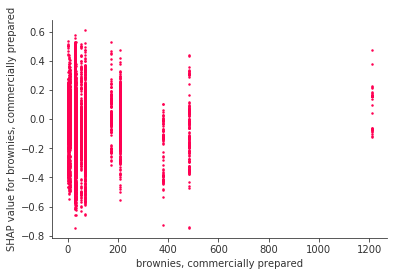

In [50]:
## dose response plot
ll = X_test.columns.get_loc("brownies, commercially prepared")
shap.plot((X_test.iloc[:,ll].as_matrix()), shap_values[:,ll], "brownies, commercially prepared")